In [1]:
#python3
%matplotlib inline
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import mpl_toolkits.mplot3d.axes3d as p3
from matplotlib.patches import Ellipse
from IPython.display import HTML

1. 太陽軌道演算(3D)(固定速度)

In [3]:
def V_sun(x0,y0,z0,vx0,vy0,vz0,t0,tf,h):
    N=int(tf/h)
    XX_s=[x0]
    YY_s=[y0]
    ZZ_s=[z0]
    VX_s=[vx0]
    VY_s=[vy0]
    VZ_s=[vz0]
    for i in range(0,N):
        VX_s.append(vx0)
        VY_s.append(vy0)
        VZ_s.append(vz0)
        XX_s.append(XX_s[i]+VX_s[i]*h)
        YY_s.append(YY_s[i]+VY_s[i]*h)
        ZZ_s.append(ZZ_s[i]+VZ_s[i]*h)
    return XX_s,YY_s,ZZ_s,VX_s,VY_s,VZ_s    

2. 地球、月球軌道演算(3D)(Verlet)

In [4]:
#mpl.rcParams['animation.ffmpeg_path'] = r"/cluster/home/sychang/ffmpeg-master-latest-win64-gpl/bin/ffmpeg.exe"
def V(x0,y0,z0,vx0,vy0,vz0,t0,tf,h,x0_s,y0_s,z0_s,vx0_s,vy0_s,vz0_s,x0_m,y0_m,z0_m,vx0_m,vy0_m,vz0_m):
    #const=km/hr
    G=8.6492*10**-13
    M=1.9891*(10**30)
    m=5.9723*(10**24)
    mm=7.3477*(10**22)
    N=int(tf/h) 
    XX=[x0]
    YY=[y0]
    ZZ=[z0]
    VX=[]
    VY=[]
    VZ=[]
    VX1=[vx0]
    VY1=[vy0]
    VZ1=[vz0]
    XX_m=[x0_m]
    YY_m=[y0_m]
    ZZ_m=[z0_m]
    VX_m=[]
    VY_m=[]
    VZ_m=[]
    VX1_m=[vx0_m]
    VY1_m=[vy0_m]
    VZ1_m=[vz0_m]
    xt=[t0]
    PE_e=[]
    PE_m=[]
    XX_s,YY_s,ZZ_s,VX_s,VY_s,VZ_s = V_sun(x0_s,y0_s,z0_s,vx0_s,vy0_s,vz0_s,t0,tf,h)
    #--------------------------------------------------------------------------------------------------------------------
    ax0=0.5*h*(-G*M*(XX[0]-XX_s[0])/np.abs(((XX[0]-XX_s[0])**2+(YY[0]-YY_s[0])**2+(ZZ[0]-ZZ_s[0])**2)**1.5))#地日
    ax1=0.5*h*(-G*mm*(XX[0]-XX_m[0])/np.abs(((XX[0]-XX_m[0])**2+(YY[0]-YY_m[0])**2+(ZZ[0]-ZZ_m[0])**2)**1.5))#地月
    VX.append(vx0+ax0+ax1)
    
    ay0=0.5*h*(-G*M*(YY[0]-YY_s[0])/np.abs(((XX[0]-XX_s[0])**2+(YY[0]-YY_s[0])**2+(ZZ[0]-ZZ_s[0])**2)**1.5))#地日
    ay1=0.5*h*(-G*mm*(YY[0]-YY_m[0])/np.abs(((XX[0]-XX_m[0])**2+(YY[0]-YY_m[0])**2+(ZZ[0]-ZZ_m[0])**2)**1.5))#地月
    VY.append(vy0+ay0+ay1)
    
    az0=0.5*h*(-G*M*(ZZ[0]-ZZ_s[0])/np.abs(((XX[0]-XX_s[0])**2+(YY[0]-YY_s[0])**2+(ZZ[0]-ZZ_s[0])**2)**1.5))#地日
    az1=0.5*h*(-G*mm*(ZZ[0]-ZZ_m[0])/np.abs(((XX[0]-XX_m[0])**2+(YY[0]-YY_m[0])**2+(ZZ[0]-ZZ_m[0])**2)**1.5))#地月
    VZ.append(vz0+az0+az1)
    
    PE_e.append((-G*m*M/np.abs(((XX[0]-XX_s[0])**2+(YY[0]-YY_s[0])**2+(ZZ[0]-ZZ_s[0])**2)**0.5))+(-G*m*mm/np.abs(((XX[0]-XX_m[0])**2+(YY[0]-YY_m[0])**2+(ZZ[0]-ZZ_m[0])**2)**0.5))) #地球位能
    #---------------------------------------------------------------------------------------------------------------------
    ax0_1=0.5*h*(-G*M*(XX_m[0]-XX_s[0])/np.abs(((XX_m[0]-XX_s[0])**2+(YY_m[0]-YY_s[0])**2+(ZZ_m[0]-ZZ_s[0])**2)**1.5))#月日
    ax1_1=0.5*h*(-G*m*(XX_m[0]-XX[0])/np.abs(((XX_m[0]-XX[0])**2+(YY_m[0]-YY[0])**2+(ZZ_m[0]-ZZ[0])**2)**1.5))#月地
    VX_m.append(vx0_m+ax0_1+ax1_1)
    
    ay0_1=0.5*h*(-G*M*(YY_m[0]-YY_s[0])/np.abs(((XX_m[0]-XX_s[0])**2+(YY_m[0]-YY_s[0])**2+(ZZ_m[0]-ZZ_s[0])**2)**1.5))#月日
    ay1_1=0.5*h*(-G*m*(YY_m[0]-YY[0])/np.abs(((XX_m[0]-XX[0])**2+(YY_m[0]-YY[0])**2+(ZZ_m[0]-ZZ[0])**2)**1.5))#月地
    VY_m.append(vy0_m+ay0_1+ay1_1)
    
    az0_1=0.5*h*(-G*M*(ZZ_m[0]-ZZ_s[0])/np.abs(((XX_m[0]-XX_s[0])**2+(YY_m[0]-YY_s[0])**2+(ZZ_m[0]-ZZ_s[0])**2)**1.5))#月日
    az1_1=0.5*h*(-G*m*(ZZ_m[0]-ZZ[0])/np.abs(((XX_m[0]-XX[0])**2+(YY_m[0]-YY[0])**2+(ZZ_m[0]-ZZ[0])**2)**1.5))#月地
    VZ_m.append(vz0_m+az0_1+az1_1)
    
    PE_m.append((-G*mm*M/np.abs(((XX_m[0]-XX_s[0])**2+(YY_m[0]-YY_s[0])**2+(ZZ_m[0]-ZZ_s[0])**2)**0.5))+(-G*mm*m/np.abs(((XX_m[0]-XX[0])**2+(YY_m[0]-YY[0])**2+(ZZ_m[0]-ZZ[0])**2)**0.5))) #月球位能
    #---------------------------------------------------------------------------------------------------------------------
    tt=0
    for i in range(0,N):
        #-----------------------------
        xx=XX[i]+h*(VX[i])
        XX.append(xx)        
        yy=YY[i]+h*(VY[i])
        YY.append(yy)
        zz=ZZ[i]+h*(VZ[i])
        ZZ.append(zz)
        #-----------------------------
        xx_m=XX_m[i]+h*(VX_m[i])
        XX_m.append(xx_m)        
        yy_m=YY_m[i]+h*(VY_m[i])
        YY_m.append(yy_m)
        zz_m=ZZ_m[i]+h*(VZ_m[i])
        ZZ_m.append(zz_m)
        #----------------------------------------------------------------------------------------------------------------------------
        kx=h*(-G*M*(XX[i+1]-XX_s[i+1])/(np.abs((XX[i+1]-XX_s[i+1])**2+(YY[i+1]-YY_s[i+1])**2+(ZZ[i+1]-ZZ_s[i+1])**2)**1.5))#地日
        kx_1=h*(-G*mm*(XX[i+1]-XX_m[i+1])/(np.abs((XX[i+1]-XX_m[i+1])**2+(YY[i+1]-YY_m[i+1])**2+(ZZ[i+1]-ZZ_m[i+1])**2)**1.5))#地月
        vx1=VX[i]+0.5*(kx+kx_1)
        VX1.append(vx1)
        vx2=VX[i]+(kx+kx_1)
        VX.append(vx2)       
        ky=h*(-G*M*(YY[i+1]-YY_s[i+1])/(np.abs((XX[i+1]-XX_s[i+1])**2+(YY[i+1]-YY_s[i+1])**2+(ZZ[i+1]-ZZ_s[i+1])**2)**1.5))#地日
        ky_1=h*(-G*mm*(YY[i+1]-YY_m[i+1])/(np.abs((XX[i+1]-XX_m[i+1])**2+(YY[i+1]-YY_m[i+1])**2+(ZZ[i+1]-ZZ_m[i+1])**2)**1.5))#地月
        vy1=VY[i]+0.5*(ky+ky_1)
        VY1.append(vy1)
        vy2=VY[i]+(ky+ky_1)
        VY.append(vy2)
        kz=h*(-G*M*(ZZ[i+1]-ZZ_s[i+1])/(np.abs((XX[i+1]-XX_s[i+1])**2+(YY[i+1]-YY_s[i+1])**2+(ZZ[i+1]-ZZ_s[i+1])**2)**1.5))#地日
        kz_1=h*(-G*mm*(ZZ[i+1]-ZZ_m[i+1])/(np.abs((XX[i+1]-XX_m[i+1])**2+(YY[i+1]-YY_m[i+1])**2+(ZZ[i+1]-ZZ_m[i+1])**2)**1.5))#地月
        vz1=VZ[i]+0.5*(kz+kz_1)
        VZ1.append(vz1)
        vz2=VZ[i]+(kz+kz_1)
        VZ.append(vz2)
        
        PE_e.append((-G*m*M/np.abs(((XX[i+1]-XX_s[i+1])**2+(YY[i+1]-YY_s[i+1])**2+(ZZ[i+1]-ZZ_s[i+1])**2)**0.5))+(-G*m*mm/np.abs(((XX[i+1]-XX_m[i+1])**2+(YY[i+1]-YY_m[i+1])**2+(ZZ[i+1]-ZZ_m[i+1])**2)**0.5))) #地球位能
        #----------------------------------------------------------------------------------------------------------------------------
        kxm=h*(-G*M*(XX_m[i+1]-XX_s[i+1])/(np.abs((XX_m[i+1]-XX_s[i+1])**2+(YY_m[i+1]-YY_s[i+1])**2+(ZZ_m[i+1]-ZZ_s[i+1])**2)**1.5))#月日
        kxm_1=h*(-G*m*(XX_m[i+1]-XX[i+1])/(np.abs((XX_m[i+1]-XX[i+1])**2+(YY_m[i+1]-YY[i+1])**2+(ZZ_m[i+1]-ZZ[i+1])**2)**1.5))#月地
        vxm1=VX_m[i]+0.5*(kxm+kxm_1)
        VX1_m.append(vxm1)
        vxm2=VX_m[i]+(kxm+kxm_1)
        VX_m.append(vxm2)       
        kym=h*(-G*M*(YY_m[i+1]-YY_s[i+1])/(np.abs((XX_m[i+1]-XX_s[i+1])**2+(YY_m[i+1]-YY_s[i+1])**2+(ZZ_m[i+1]-ZZ_s[i+1])**2)**1.5))#月日
        kym_1=h*(-G*m*(YY_m[i+1]-YY[i+1])/(np.abs((XX_m[i+1]-XX[i+1])**2+(YY_m[i+1]-YY[i+1])**2+(ZZ_m[i+1]-ZZ[i+1])**2)**1.5))#月地
        vym1=VY_m[i]+0.5*(kym+kym_1)
        VY1_m.append(vym1)
        vym2=VY_m[i]+(kym+kym_1)
        VY_m.append(vym2)
        kzm=h*(-G*M*(ZZ_m[i+1]-ZZ_s[i+1])/(np.abs((XX_m[i+1]-XX_s[i+1])**2+(YY_m[i+1]-YY_s[i+1])**2+(ZZ_m[i+1]-ZZ_s[i+1])**2)**1.5))#月日
        kzm_1=h*(-G*m*(ZZ_m[i+1]-ZZ[i+1])/(np.abs((XX_m[i+1]-XX[i+1])**2+(YY_m[i+1]-YY[i+1])**2+(ZZ_m[i+1]-ZZ[i+1])**2)**1.5))#月地
        vzm1=VZ_m[i]+0.5*(kzm+kzm_1)
        VZ1_m.append(vzm1)
        vzm2=VZ_m[i]+(kzm+kzm_1)
        VZ_m.append(vzm2)    
        
        PE_m.append((-G*mm*M/np.abs(((XX_m[i+1]-XX_s[i+1])**2+(YY_m[i+1]-YY_s[i+1])**2+(ZZ_m[i+1]-ZZ_s[i+1])**2)**0.5))+(-G*mm*m/np.abs(((XX_m[i+1]-XX[i+1])**2+(YY_m[i+1]-YY[i+1])**2+(ZZ_m[i+1]-ZZ[i+1])**2)**0.5))) #月球位能
        #----------------------------------------------------------------------------------------------------------------------------
        tt=tt+h
        xt.append(tt)
    return xt,XX,YY,ZZ,VX,VX1,VY,VY1,VZ,VZ1,XX_m,YY_m,ZZ_m,VX_m,VX1_m,VY_m,VY1_m,VZ_m,VZ1_m,XX_s,YY_s,ZZ_s,VX_s,VY_s,VZ_s ,PE_e,PE_m

3. 設定初始值，呼叫主程式(日地月軌道演算)
4. 設定不同的步長h，以恆星週期及會合週期計算誤差並繪製

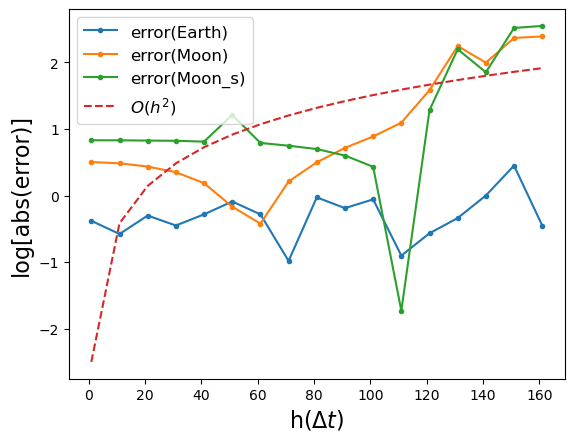

In [29]:
dist_es=1.471*10**8
dist_em=363104
angle_m=5.15/180*(np.pi)
velocity_s=0 #7.92*10**3
velocity_e=1.09*10**5
velocity_m=velocity_e+3672
ideal_e=365.25
ideal_m=27.32 #恆星週期
ideal_m1=29.53 #會合週期
tf=8766*3 #8766
h=[]
for i in range(1,170,10):
    h.append(i) #0.5,1,10,24,168
P_e=[]
P_m=[]
P_m1=[]
for ih in h:
    t,x,y,z,vx,vx1,vy,vy1,vz,vz1,x_m,y_m,z_m,vx_m,vx1_m,vy_m,vy1_m,vz_m,vz1_m,x_s,y_s,z_s,vx_s,vy_s,vz_s,PE_e,PE_m =V(-(dist_es),0,0,0,-(velocity_e),0,0,tf,ih,0,0,0,0,0,velocity_s,(-(dist_es)-(dist_em*np.cos(angle_m))),0,dist_em*np.sin(angle_m),0,-(velocity_m),0)
    d_es=[]
    d_ms=[]
    d_me=[]
    for i,j,k,ii,jj,kk,iii,jjj,kkk in zip(x,y,z,x_m,y_m,z_m,x_s,y_s,z_s):
        d_es.append(np.abs(((i-iii)**2+(j-jjj)**2+(k-kkk)**2)**0.5))
        d_ms.append(np.abs(((ii-iii)**2+(jj-jjj)**2+(kk-kkk)**2)**0.5))
        d_me.append(np.abs(((ii-i)**2+(jj-j)**2+(kk-k)**2)**0.5))
        
    period_e=[]
    period_m=[]
    period_me=[]
    for i in range(1,len(d_es)-1):
        if d_es[i-1] > d_es[i] and d_es[i] < d_es[i+1]:
            period_e.append(t[i])
    for i in range(1,len(d_ms)-1):
        if d_ms[i-1] < d_ms[i] and d_ms[i] > d_ms[i+1]:
            period_m.append(t[i])
    for i in range(1,len(d_me)-1):
        if d_me[i-1] < d_me[i] and d_me[i] > d_me[i+1]:
            period_me.append(t[i])
    
    moon_T=[period_m[0]/24.0]
    moon_T1=[period_me[0]/24.0]
    earth_T=[period_e[0]/24.0]
    for i in range(1,len(period_e)):
        earth_T.append((period_e[i]-period_e[i-1])/24.0)
    for i in range(1,len(period_m)):
        moon_T.append((period_m[i]-period_m[i-1])/24.0)
    for i in range(1,len(period_me)):
        moon_T1.append((period_me[i]-period_me[i-1])/24.0)
    
    P_e.append(np.log10(np.abs(np.mean(earth_T)-ideal_e)))
    P_m.append(np.log10(np.abs(np.mean(moon_T)-ideal_m)))
    P_m1.append(np.log10(np.abs(np.mean(moon_T1)-ideal_m1)))

hh=[]
for i in h:
    hh.append(np.log10(i**2)-2.5)
plt.figure()#error
plt.plot(h,P_e,'.-',label='error(Earth)')
plt.plot(h,P_m,'.-',label='error(Moon)')
plt.plot(h,P_m1,'.-',label='error(Moon_s)')
plt.plot(h,hh,'--',label='$O(h^2)$')
plt.xlabel('h($\Delta t$)',fontsize=16)
plt.ylabel('log[abs(error)]',fontsize=16)
plt.legend(loc='upper left',fontsize=12)
#plt.savefig('T_error(3yr)(v_s=0)')

繪製地球vt圖

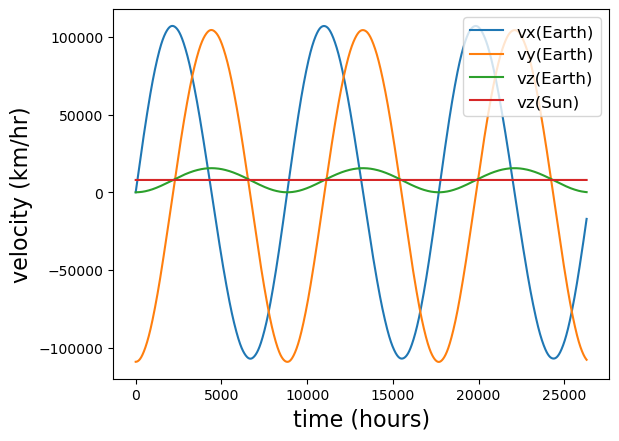

In [660]:
plt.figure()
plt.plot(t,vx1,label='vx(Earth)')
plt.plot(t,vy1,label='vy(Earth)')
plt.plot(t,vz1,label='vz(Earth)')
plt.plot(t,vz_s,label='vz(Sun)')
plt.xlabel('time (hours)',fontsize=16)
plt.ylabel('velocity (km/hr)',fontsize=16)
plt.legend(loc='upper right',fontsize=12)
#plt.savefig('v_e(1yr)(v_s=true)')

繪製月球vt圖

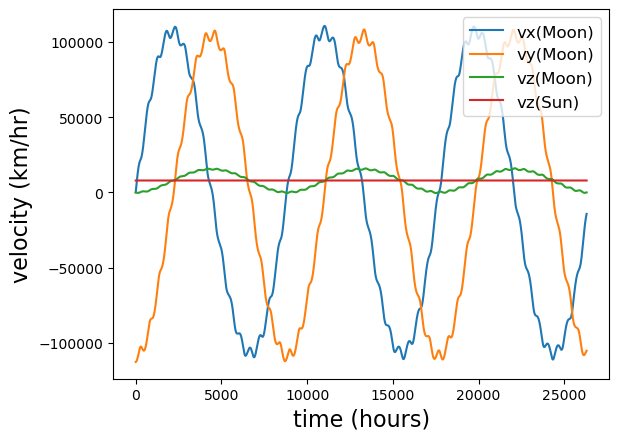

In [661]:
plt.figure()
plt.plot(t,vx1_m,label='vx(Moon)')
plt.plot(t,vy1_m,label='vy(Moon)')
plt.plot(t,vz1_m,label='vz(Moon)')
plt.plot(t,vz_s,label='vz(Sun)')
plt.xlabel('time (hours)',fontsize=16)
plt.ylabel('velocity (km/hr)',fontsize=16)
plt.legend(loc='upper right',fontsize=12)
#plt.savefig('v_m(3yr)(v_s=true)')

5. 計算日地、日月、月地距離

In [662]:
d_es=[]
d_ms=[]
d_me=[]
for i,j,k,ii,jj,kk,iii,jjj,kkk in zip(x,y,z,x_m,y_m,z_m,x_s,y_s,z_s):
    d_es.append(np.abs(((i-iii)**2+(j-jjj)**2+(k-kkk)**2)**0.5))
    d_ms.append(np.abs(((ii-iii)**2+(jj-jjj)**2+(kk-kkk)**2)**0.5))
    d_me.append(np.abs(((ii-i)**2+(jj-j)**2+(kk-k)**2)**0.5))

繪製日地、日月距離xt圖

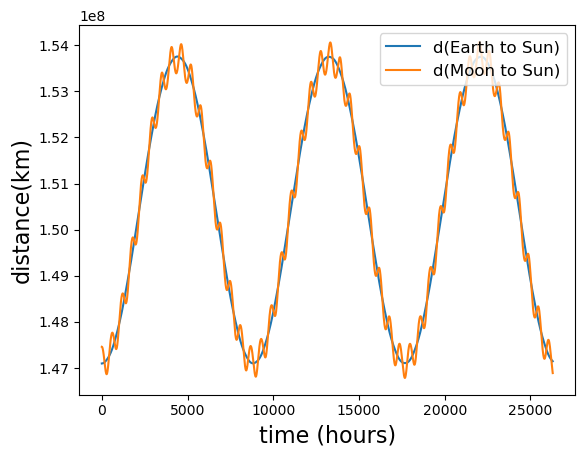

In [663]:
plt.figure()
plt.plot(t,d_es,label='d(Earth to Sun)')
plt.plot(t,d_ms,label='d(Moon to Sun)')
plt.xlabel('time (hours)',fontsize=16)
plt.ylabel('distance(km)',fontsize=16)
plt.legend(loc='upper right',fontsize=12)
#plt.savefig('d_es(3yr)(v_s=true)')

繪製月地距離xt圖

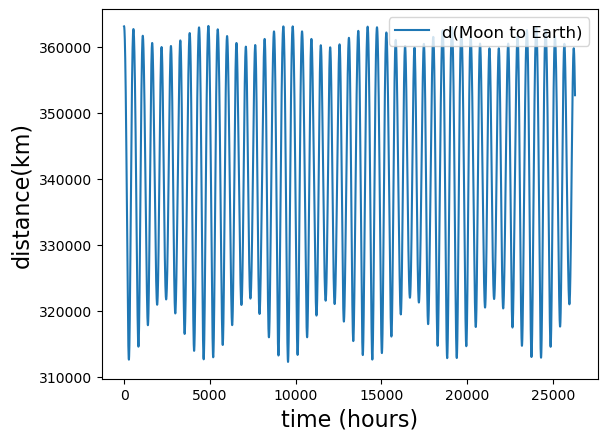

In [664]:
plt.figure()
plt.plot(t,d_me,label='d(Moon to Earth)')
plt.xlabel('time (hours)',fontsize=16)
plt.ylabel('distance(km)',fontsize=16)
plt.legend(loc='upper right',fontsize=12)
#plt.savefig('d_em(3yr)(v_s=true)')

6. 計算恆星週期及會合週期並以天為單位，以計算誤差(演算3年取平均)

In [665]:
period_e=[]
period_m=[]
period_me=[]
for i in range(1,len(d_es)-1):
    if d_es[i-1] > d_es[i] and d_es[i] < d_es[i+1]:
        period_e.append(t[i])
for i in range(1,len(d_ms)-1):
    if d_ms[i-1] < d_ms[i] and d_ms[i] > d_ms[i+1]:
        period_m.append(t[i])
for i in range(1,len(d_me)-1):
    if d_me[i-1] < d_me[i] and d_me[i] > d_me[i+1]:
        period_me.append(t[i])

In [666]:
moon_T=[period_m[0]/24.0]
moon_T1=[period_me[0]/24.0]
earth_T=[period_e[0]/24.0]
for i in range(1,len(period_e)):
    earth_T.append((period_e[i]-period_e[i-1])/24.0)
for i in range(1,len(period_m)):
    moon_T.append((period_m[i]-period_m[i-1])/24.0)
for i in range(1,len(period_me)):
    moon_T1.append((period_me[i]-period_me[i-1])/24.0)

In [667]:
np.mean(earth_T)

368.27083333333337

In [669]:
np.mean(moon_T)

24.115740740740744

7. 設定動畫初值及初始狀態繪圖

/tmp/ipykernel_2800/861194709.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax=fig.gca(projection='3d')


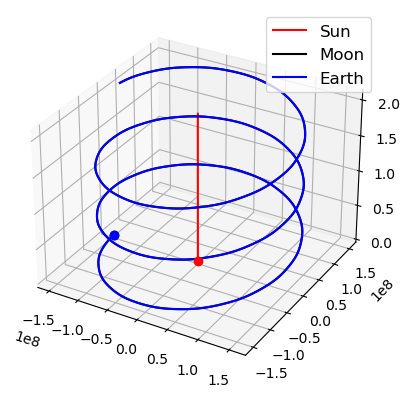

In [670]:
fig = plt.figure()
ax=fig.gca(projection='3d')
ax.plot3D(x_s,y_s,z_s,label='Sun',color='red')
ax.plot3D(x_m,y_m,z_m,label='Moon',color='black')
ax.plot3D(x,y,z,label='Earth',color='blue')
#ax.set_zlim(-1.0*10**9, 1.0*10**9)
'''e=Ellipse(xy = (2.5*10**6, 0.0), width = 2*1.469*10**8, height = 2*1.4958*10**8,
          angle = 0, edgecolor= 'red',fill=False,label='Ellipse orbit')
ax.add_patch(e)'''
line1, =ax.plot3D(x_s[0],y_s[0],z_s[0],'o',color='red')
line2, = ax.plot3D(x_m[0], y_m[0], z_m[0],'o',color='black')
line, = ax.plot3D(x[0], y[0], z[0],'o',color='blue')
time_template = 'time = %.1fhours'
time_text = ax.text3D(0.01, -3.7*10**8,0, '', zdir='x',transform=ax.transAxes)
v_template='velocity = %.3fkm/hr'
v_text = ax.text3D(0.01, -3.0*10**8,0, '', zdir='x',transform=ax.transAxes)
ax.grid()
plt.legend(loc='upper right',fontsize=12)
#plt.savefig('orbit_em(3yr)(v_m no v_e)')

動畫設定

In [671]:
def init():
    #ax.set_xlim(-2.0*10**8, 2.0*10**8)
    #ax.set_ylim(-2.0*10**8, 2.0*10**8)
    time_text.set_text('')
    v_text.set_text('')
    return line, time_text,v_text

動畫更新

In [672]:
def update(i):
    newx = x[i]
    newy = y[i]
    newz = z[i]
    newvx=vx1[i]
    newvy=vy1[i]
    newvz=vz1[i]
    newx_s = x_s[i]
    newy_s = y_s[i]
    newz_s = z_s[i]
    newvx_s=vx_s[i]
    newvy_s=vy_s[i]
    newvz_s=vz_s[i]
    newx_m = x_m[i]
    newy_m = y_m[i]
    newz_m = z_m[i]
    newvx_m=vx_m[i]
    newvy_m=vy_m[i]
    newvz_m=vz_m[i]
    v_abs=(newvx**2+newvy**2+newvz**2)**0.5
    line.set_data_3d(newx, newy ,newz)
    line1.set_data_3d(newx_s, newy_s ,newz_s)
    line2.set_data_3d(newx_m, newy_m ,newz_m)
    #U = newvx*np.cos(45/180*np.pi)
    #V = newvy*np.sin(45/180*np.pi)
    #Q = ax.quiver(newx, newy, U, V)
    #Q.set_UVC(U,V)
    time_text.set_text(time_template %(i))
    v_text.set_text(v_template %(v_abs))
    #plt.clf()
    return line,line1,line2,time_text,v_text

8. 製作動畫

In [673]:
ani = animation.FuncAnimation(fig, update, range(1, len(x)), init_func=init, interval=5,blit=True)
'''f = r'cluster/home/sychang/astr660' 
writervideo = animation.FFMpegWriter(fps=60)
ani.save(f, writer=writervideo)'''

HTML(ani.to_html5_video())

9. 計算軌道能量

地球軌道能量

In [654]:
def E_e(vx1,vy1,vz1,PE_e):   
    G=8.6492*10**-13
    M=1.9891*(10**30)
    m=5.9723*10**24
    mm=7.3477*(10**22)
    KE_e=[]
    TE_e=[]
    for i in range(0,len(PE_e)):
        KEE=0.5*m*((vx1[i]**2)+(vy1[i]**2)+(vz1[i]**2))
        KE_e.append(KEE)
        TEE=PE_e[i]+KE_e[i]
        TE_e.append(TEE)
    return KE_e,TE_e

繪製地球軌道能量隨時間變化

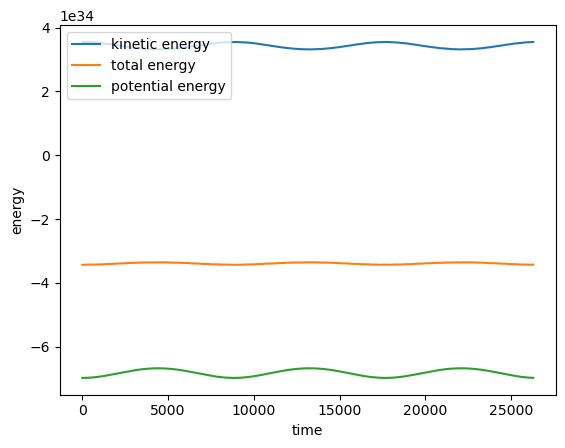

In [655]:
ke_e,te_e=E_e(vx1,vy1,vz1,PE_e)
plt.figure()
plt.plot(t,ke_e, label='kinetic energy')
plt.plot(t,te_e, label='total energy')
plt.plot(t,PE_e, label='potential energy')
plt.xlabel('time')
plt.ylabel('energy')
plt.legend(loc='upper left')
plt.savefig('energy_e(3yr)')

月球軌道能量

In [656]:
def E_m(vx1_m,vy1_m,vz1_m,PE_m):   
    G=8.6492*10**-13
    M=1.9891*(10**30)
    m=5.9723*10**24
    mm=7.3477*(10**22)
    KE_m=[]
    TE_m=[]
    for i in range(0,len(PE_m)):
        KEE=0.5*mm*((vx1_m[i]**2)+(vy1_m[i]**2)+(vz1_m[i]**2))
        KE_m.append(KEE)
        TEE=PE_m[i]+KE_m[i]
        TE_m.append(TEE)
    return KE_m,TE_m

繪製月球軌道能量隨時間變化

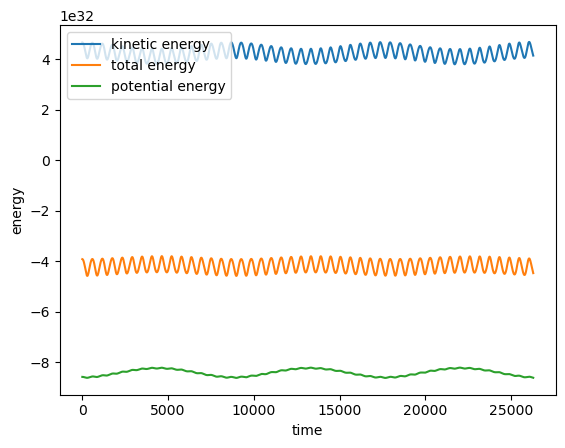

In [657]:
ke_m,te_m=E_m(vx1_m,vy1_m,vz1_m,PE_m)
plt.figure()
plt.plot(t,ke_m, label='kinetic energy')
plt.plot(t,te_m, label='total energy')
plt.plot(t,PE_m, label='potential energy')
plt.xlabel('time')
plt.ylabel('energy')
plt.legend(loc='upper left')
plt.savefig('energy_m(3yr)')